In [1]:
import pandas as pd

import warnings

warnings.filterwarnings("ignore")

In [2]:
data = pd.read_csv("../data/PV_panel_power_with_weather_hour.csv", delimiter=";")
data

,DATE,PRESSURE,IGRO,RAFF_WIND,RAIN,AIR_TEMPERATURE_CELSIUS,DIRECTION_WIND,IRRADIANCE_SOLAR,VELOCITY_WIND,PV_Power,MODELICA,MODELICA_ERROR,SHADOW
0,2016-02-18 00:00:00,951.9,100.0,3.2,0.0,3.0,350.0,0.0,1.0,0,0.0,0.0,0.0
1,2016-02-18 01:00:00,951.9,100.0,3.2,0.0,3.0,350.0,0.0,1.0,0,0.0,0.0,0.0
2,2016-02-18 02:00:00,951.6,100.0,3.1,0.0,3.0,4.0,0.0,1.0,0,0.0,0.0,0.0
3,2016-02-18 03:00:00,951.3,100.0,2.6,0.0,3.0,356.0,0.0,1.0,0,0.0,0.0,0.0
4,2016-02-18 04:00:00,950.8,100.0,2.6,0.0,3.0,17.0,0.0,1.0,0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22987,2018-11-02 19:00:00,953.8,85.0,4.1,0.0,11.0,240.0,0.0,2.0,0,0.0,0.0,0.0
22988,2018-11-02 20:00:00,954.3,82.0,2.6,0.0,11.0,325.0,0.0,1.0,0,0.0,0.0,0.0
22989,2018-11-02 21:00:00,954.3,86.0,2.8,0.0,11.0,244.0,0.0,1.0,0,0.0,0.0,0.0
22990,2018-11-02 22:00:00,954.5,83.0,4.2,0.0,11.0,223.0,0.0,2.0,0,0.0,0.0,0.0


In [3]:
data["DATE"] = pd.to_datetime(data["DATE"])
data = data.drop(["MODELICA", 'MODELICA_ERROR', 'SHADOW'], axis=1)  #dropping IDs
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 22992 entries, 0 to 22991
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   DATE                     22992 non-null  datetime64[ns]
 1   PRESSURE                 22992 non-null  float64       
 2   IGRO                     22992 non-null  float64       
 3   RAFF_WIND                22992 non-null  float64       
 4   RAIN                     22992 non-null  float64       
 5   AIR_TEMPERATURE_CELSIUS  22992 non-null  float64       
 6   DIRECTION_WIND           22992 non-null  float64       
 7   IRRADIANCE_SOLAR         22992 non-null  float64       
 8   VELOCITY_WIND            22992 non-null  float64       
 9   PV_Power                 22992 non-null  int64         
dtypes: datetime64[ns](1), float64(8), int64(1)
memory usage: 1.8 MB


In [ ]:
"""
18 Şubat 2016 - 2 Kasım 2018 tarihleri arasındaki zaman diliminde her saat için ölçülmüştür, ancak bazı tarihler eksiktir. Toplamda, her biri 24 ölçüm kaydı içeren 989 tarih bulunmaktadır.

'PRESSURE'  basınç (hPa)
'IGRO'  hava nem oranı (%)
'RAFF_WIND' rüzgar hortum hızı (m/s)
'RAIN' yağış miktarı (mm)
'AIR_TEMPERATURE_CELSIUS' sıcaklık (°C)
'DIRECTION_WIND' rüzgar yönü (°)
'IRRADIANCE_SOLAR'  güneş ışınımı (W/m²)
'VELOCITY_WIND' rüzgar hızı (m/s)
'PV_Power' invertörün enerji üretimi (Wh)
'MODELICA'
'MODELICA_ERROR'
'SHADOW'
"""

In [8]:
import plotly.express as px
df = data.copy()

fig = px.line(
    df,
    x='DATE',
    y='PV_Power',
    title="Power Produced Over Years",
    labels={'DATE': 'Date', 'PV_Power': 'Power (Wh)'},
    template='plotly_white'
)

# Customize line color and layout
fig.update_traces(line_color='red')
fig.update_layout(width=1200, height=400)

# Show the plot
fig.show()

In [ ]:
# 1. veri kümesinde mevsimsellik var, heryıl benzer yıllık olarak incelendiğinde benzer şekilde hareket ettiğini görüyoruz, 2018 yılında veride boşluklar var 

In [16]:
from datetime import datetime

df["Year"]= df['DATE'].dt.year
df["Month"]= df['DATE'].dt.month
df["Date_no"]= df['DATE'].dt.day
df["Hour"]= df['DATE'].dt.hour
df["Day"]= df.DATE.dt.strftime("%A")
df['Weekday'] = [datetime.weekday(date) for date in df.DATE]
df["IsWeekend"] = df["Weekday"] >= 5
df['DayOfYear'] = df['DATE'].dt.dayofyear

In [19]:
df['DateOnly'] = df['DATE'].dt.date
daily_data = df.groupby('DateOnly')['PV_Power'].mean().reset_index()
daily_data.columns = ['DateOnly', 'DailyMeanPVPower']

df = pd.merge(df, daily_data, left_on=df['DATE'].dt.date, right_on='DateOnly', how='left')
df

,DateOnly,DATE,PRESSURE,IGRO,RAFF_WIND,RAIN,AIR_TEMPERATURE_CELSIUS,DIRECTION_WIND,IRRADIANCE_SOLAR,VELOCITY_WIND,...,Month,Date_no,Hour,Day,Weekday,IsWeekend,DayOfYear,DateOnly_x,DateOnly_y,DailyMeanPVPower
0,2016-02-18,2016-02-18 00:00:00,951.9,100.0,3.2,0.0,3.0,350.0,0.0,1.0,...,2,18,0,Thursday,3,False,49,2016-02-18,2016-02-18,2254.666667
1,2016-02-18,2016-02-18 01:00:00,951.9,100.0,3.2,0.0,3.0,350.0,0.0,1.0,...,2,18,1,Thursday,3,False,49,2016-02-18,2016-02-18,2254.666667
2,2016-02-18,2016-02-18 02:00:00,951.6,100.0,3.1,0.0,3.0,4.0,0.0,1.0,...,2,18,2,Thursday,3,False,49,2016-02-18,2016-02-18,2254.666667
3,2016-02-18,2016-02-18 03:00:00,951.3,100.0,2.6,0.0,3.0,356.0,0.0,1.0,...,2,18,3,Thursday,3,False,49,2016-02-18,2016-02-18,2254.666667
4,2016-02-18,2016-02-18 04:00:00,950.8,100.0,2.6,0.0,3.0,17.0,0.0,1.0,...,2,18,4,Thursday,3,False,49,2016-02-18,2016-02-18,2254.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22987,2018-11-02,2018-11-02 19:00:00,953.8,85.0,4.1,0.0,11.0,240.0,0.0,2.0,...,11,2,19,Friday,4,False,306,2018-11-02,2018-11-02,1140.541667
22988,2018-11-02,2018-11-02 20:00:00,954.3,82.0,2.6,0.0,11.0,325.0,0.0,1.0,...,11,2,20,Friday,4,False,306,2018-11-02,2018-11-02,1140.541667
22989,2018-11-02,2018-11-02 21:00:00,954.3,86.0,2.8,0.0,11.0,244.0,0.0,1.0,...,11,2,21,Friday,4,False,306,2018-11-02,2018-11-02,1140.541667
22990,2018-11-02,2018-11-02 22:00:00,954.5,83.0,4.2,0.0,11.0,223.0,0.0,2.0,...,11,2,22,Friday,4,False,306,2018-11-02,2018-11-02,1140.541667


In [27]:
weekly_avg = df.groupby(['Year', 'Month', 'DayOfYear'])[['DailyMeanPVPower']].mean().reset_index()
monthly_avg = df.groupby(['Year', 'Month'])[['DailyMeanPVPower']].mean().reset_index()
yearly_avg = df.groupby(['Year'])[['DailyMeanPVPower']].mean().reset_index()


In [28]:
import plotly.express as px

fig_weekly = px.line(
    weekly_avg,
    x='DayOfYear',
    y='DailyMeanPVPower',
    color='Year',
    title='Weekly Average Daily PV_Power by Year',
    labels={'DailyMeanPVPower': 'Average Daily PV Power', 'DayOfYear': 'Day of Year'}
)
fig_weekly.show()


In [29]:
fig_monthly = px.line(
    monthly_avg,
    x='Month',
    y='DailyMeanPVPower',
    color='Year',
    title='Monthly Average Daily PV_Power by Year',
    labels={'DailyMeanPVPower': 'Average Daily PV Power', 'Month': 'Month'}
)
fig_monthly.show()


In [30]:
fig_yearly = px.bar(
    yearly_avg,
    x='Year',
    y='DailyMeanPVPower',
    title='Yearly Average Daily PV_Power',
    labels={'DailyMeanPVPower': 'Average Daily PV Power', 'Year': 'Year'}
)
fig_yearly.show()


In [42]:
import plotly.express as px

melted_data = df.melt(
    id_vars=['DATE'],
    value_vars=['PV_Power', 'PRESSURE', 'IGRO', 'RAFF_WIND', 'RAIN',
                'AIR_TEMPERATURE_CELSIUS', 'DIRECTION_WIND', 
                'IRRADIANCE_SOLAR', 'VELOCITY_WIND'],
    var_name='Feature',
    value_name='Value'
)

fig = px.line(
    melted_data,
    x='DATE',
    y='Value',
    color='Feature',
    facet_row='Feature',  
    labels={'Value': 'Value', 'DATE': 'Date'},
    height=1200  
)

fig.update_yaxes(matches=None)

fig.update_layout(
    legend=dict(
        orientation="h",  
        yanchor="bottom",
        y=1.02,
        xanchor="right",
        x=1
    ),
    title_x=0.5 
)

fig.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


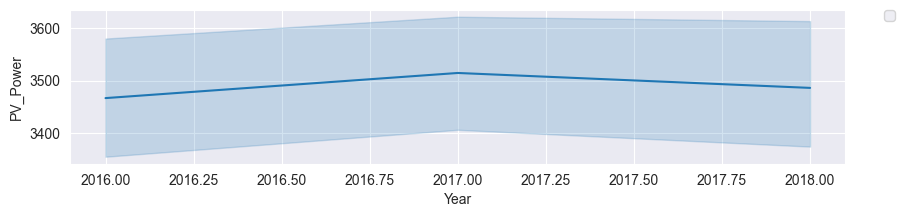

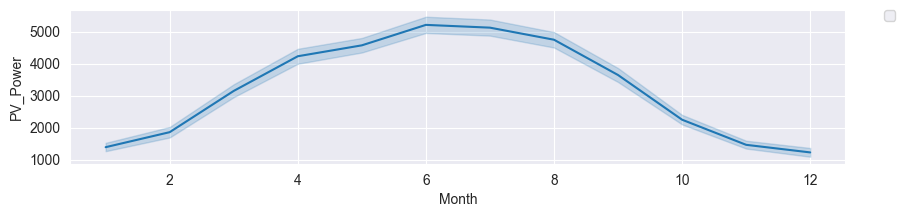

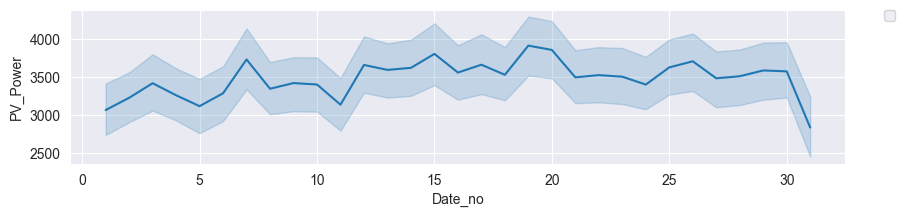

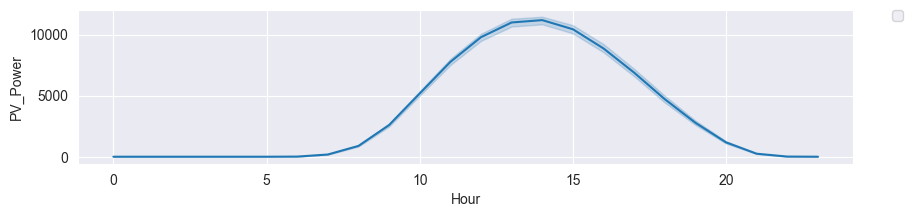

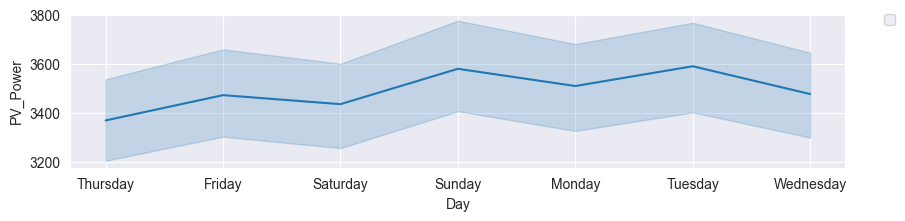

In [46]:
import matplotlib.pyplot as plt
import seaborn as sns

new_features = ["Year" ,"Month", "Date_no", "Hour", "Day"]

for i in new_features:
    plt.figure(figsize=(10,2))
    ax=sns.lineplot(x=df[i],y="PV_Power",data=df)
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

<Axes: >

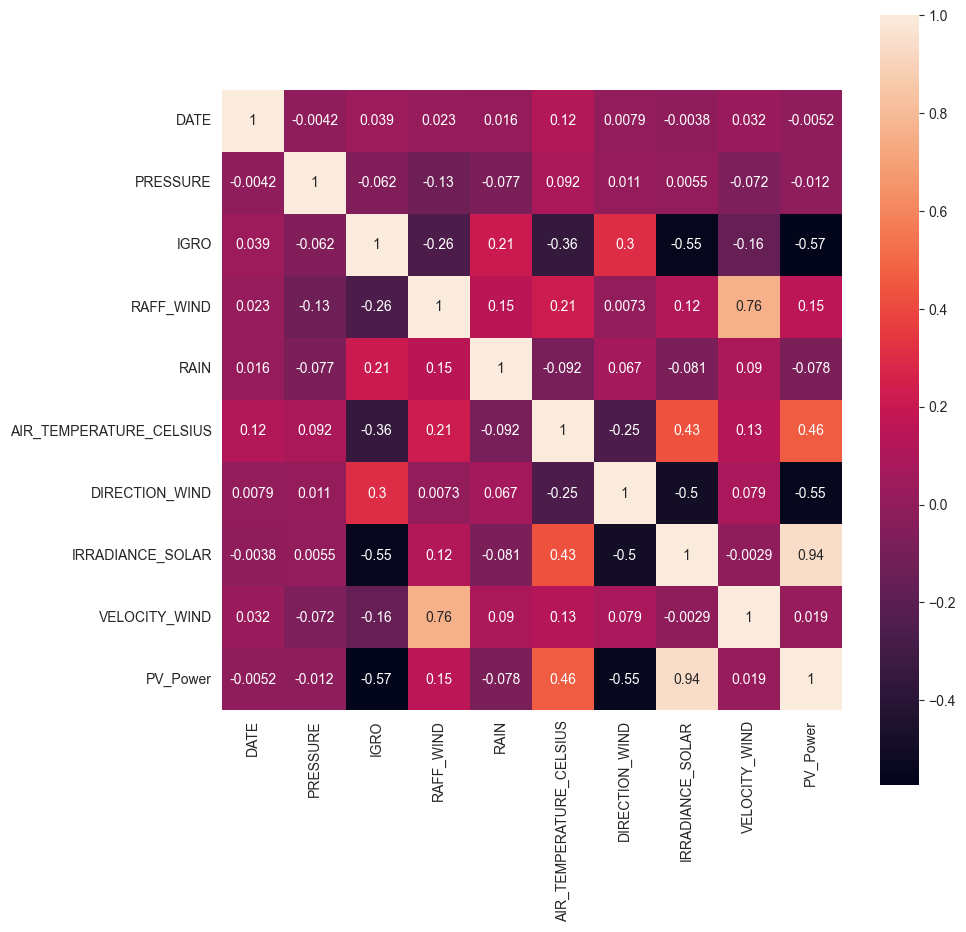

In [47]:
corrmat = data.corr()
plt.subplots(figsize=(10,10))
sns.heatmap(corrmat,annot=True,square=True, )

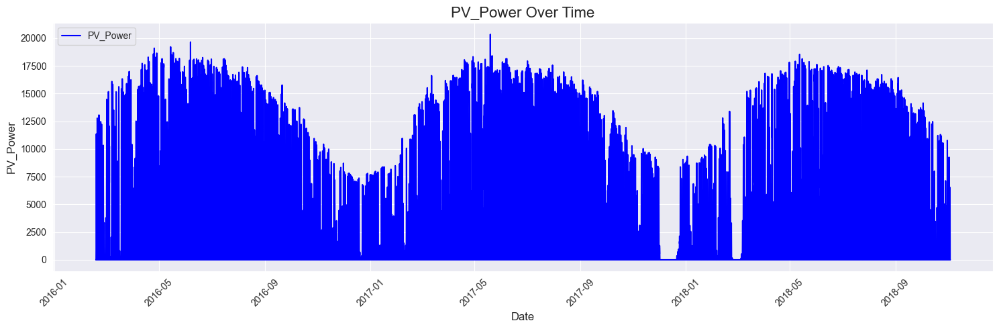

In [49]:
plt.figure(figsize=(15, 5))
sns.lineplot(x=df['DATE'], y=df['PV_Power'], color="blue", label="PV_Power")

plt.title("PV_Power Over Time", fontsize=16)
plt.xlabel("Date", fontsize=12)
plt.ylabel("PV_Power", fontsize=12)
plt.legend(loc="upper left")  
plt.xticks(rotation=45)  
plt.tight_layout()

plt.show()

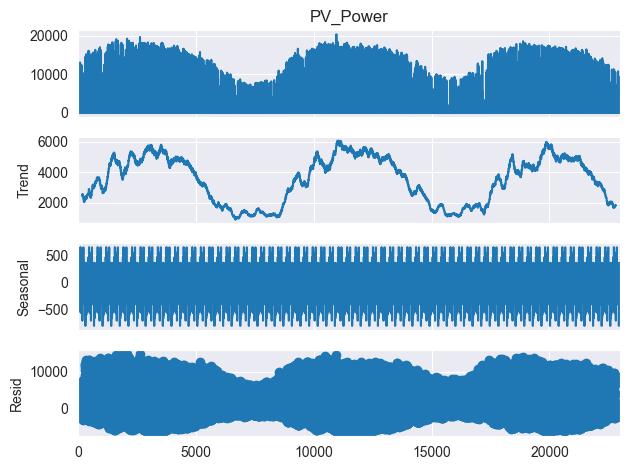

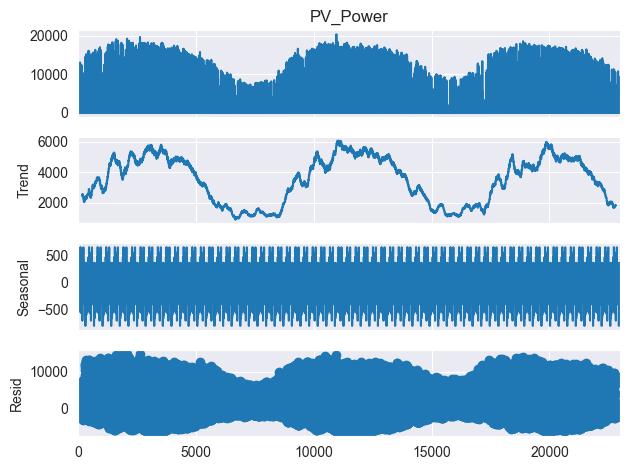

In [54]:
from statsmodels.tsa.seasonal import seasonal_decompose

seasonal_decompose(df['PV_Power'], model='additive', period=365).plot()


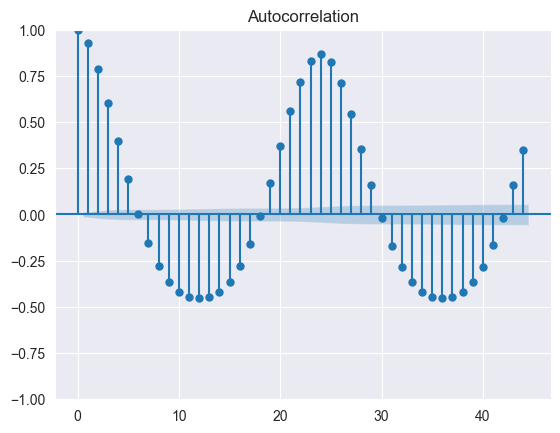

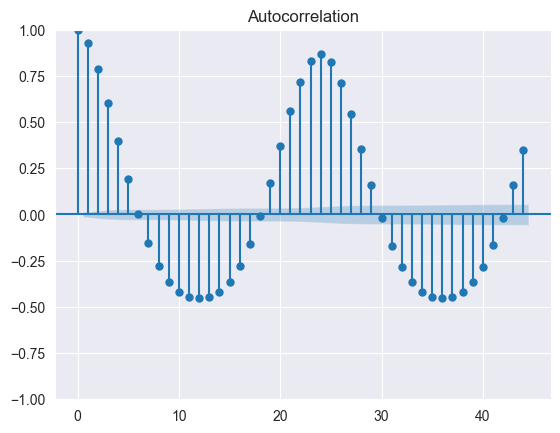

In [52]:
from statsmodels.graphics.tsaplots import plot_acf

plot_acf(df['PV_Power'])


In [55]:
from statsmodels.tsa.stattools import adfuller

series = df['PV_Power'].dropna()

adf_result = adfuller(series)

print("ADF Statistic:", adf_result[0])
print("p-value:", adf_result[1])
print("Critical Values:")
for key, value in adf_result[4].items():
    print(f"   {key}: {value}")

if adf_result[1] < 0.05:
    print("\nSonuç: Seri durağandır (H0 reddedildi).")
else:
    print("\nSonuç: Seri durağan değildir (H0 reddedilemedi).")


ADF Statistic: -7.915211602044546
p-value: 3.852529754688989e-12
Critical Values:
   1%: -3.430635030800888
   5%: -2.8616659744870026
   10%: -2.5668370526224966

Sonuç: Seri durağandır (H0 reddedildi).


In [4]:
# Percentage of zeros in each column
zero_percentage = (data == 0).mean() * 100
print("Percentage of Zero Values:\n", zero_percentage)

# Handling columns with more than 20% zeros
for col in data.columns:
    if zero_percentage[col] > 20:
        data[col] = data[col].replace(0, data[col].median())  # Example: Replace with median


Percentage of Zero Values:
 DATE                        0.000000
PRESSURE                    0.000000
IGRO                        0.000000
RAFF_WIND                   0.013048
RAIN                       93.554280
AIR_TEMPERATURE_CELSIUS     1.413535
DIRECTION_WIND              0.113083
IRRADIANCE_SOLAR           53.127175
VELOCITY_WIND              15.218337
PV_Power                   43.475992
dtype: float64
